# Setup

## Imports

In [1]:
import QuantumToolbox as qt
import SuperconductingCavities as SC
import CairoMakie as cm
using Revise
using Dates
import JSON3

using ProgressMeter

import Optim as opt

using Logging
using MiniLoggers

using IJulia
if isdefined(Main, :IJulia)
    Main.IJulia.stdio_bytes[] = 0;
end


┌ Info: new driver key :netcdf, updating backendlist.
└ @ NetCDFExt /home/gr400/.julia/packages/YAXArrayBase/Xj43k/ext/NetCDFExt.jl:81


0

## Logger Setups

In [2]:
# MiniLogger(minlevel = MiniLoggers.Info) |> global_logger
InfoLogger = MiniLogger(minlevel = MiniLoggers.Info)
ProgressLogger = MiniLogger(minlevel = LogLevel(-1))
DebugLogger = MiniLogger(minlevel = MiniLoggers.Debug)

global_logger(ProgressLogger)

Base.CoreLogging.SimpleLogger(VSCodeServer.IJuliaCore.IJuliaStdio{Base.PipeEndpoint, typeof(VSCodeServer.io_send_callback)}(IOContext(Base.PipeEndpoint(RawFD(22) open, 0 bytes waiting)), VSCodeServer.io_send_callback), Info, Dict{Any, Int64}())

# Loading Model and json

In [3]:
#Mode10 = SC.Circuits.Transmon_Resonators.load("ModelSaves/Mode10/Mode10.json");
Models = [SC.Circuits.Transmon_Resonators.load("ModelSaves/Mode$i/Mode$i.json") for i in 1:10];

# Getting Data

## Running Data Gathering

In [4]:
f0g1_res = []

for i in 1:10
    println("Running Mode $i")
    ψ = Models[i].dressed_states[(2,0)]
    push!(f0g1_res, SC.Dynamics.RunPulseSequence(Models[i], ψ, ["sb_f0g1"]))
end

Running Mode 1
The Name for this run is: Operator_Sequence_2024-11-12T12:20:36.711
It is being saved at: Data/
[2024-11-12 12:20:36] Info: Running operator sb_f0g1
[2024-11-12 12:20:37] Info: Running Time Evolution
Progress: [==============================] 100.0% --- Elapsed Time: 0h 00m 07s (ETA: 0h 00m 00s)
[2024-11-12 12:20:46] Info: Time Evolution Complete
[2024-11-12 12:20:46] Info: Saving Steps
[2024-11-12 12:20:51] Info: Done with Step_1
[2024-11-12 12:20:51] Info: Done With Running Sequence
[2024-11-12 12:20:51] Info: Loading Data


Progress: 100%|█████████████████████████████████████████| Time: 0:00:01


Running Mode 2
The Name for this run is: Operator_Sequence_2024-11-12T12:20:53.504
It is being saved at: Data/
[2024-11-12 12:20:53] Info: Running operator sb_f0g1
[2024-11-12 12:20:53] Info: Running Time Evolution
Progress: [==============================] 100.0% --- Elapsed Time: 0h 00m 02s (ETA: 0h 00m 00s)
[2024-11-12 12:20:56] Info: Time Evolution Complete
[2024-11-12 12:20:56] Info: Saving Steps
[2024-11-12 12:20:56] Info: Done with Step_1
[2024-11-12 12:20:56] Info: Done With Running Sequence
[2024-11-12 12:20:56] Info: Loading Data
Running Mode 3
The Name for this run is: Operator_Sequence_2024-11-12T12:20:56.901
It is being saved at: Data/
[2024-11-12 12:20:56] Info: Running operator sb_f0g1
[2024-11-12 12:20:56] Info: Running Time Evolution
Progress: [==============================] 100.0% --- Elapsed Time: 0h 00m 02s (ETA: 0h 00m 00s)
[2024-11-12 12:20:59] Info: Time Evolution Complete
[2024-11-12 12:20:59] Info: Saving Steps
[2024-11-12 12:21:00] Info: Done with Step_1
[202

## Plots

In [9]:
f0g1_res[1]

Dict{Any, Any} with 2 entries:
  "times"  => Any[0.0, 0.199917, 0.399834, 0.599751, 0.799668, 0.999584, 1.1995…
  "states" => Any[Quantum Object:   type=Ket   dims=[10, 10]   size=(100,)…

[2024-11-11 23:02:27] Info: Making Plot
[2024-11-11 23:02:39] Info: Making Plot
[2024-11-11 23:02:40] Info: Making Plot
[2024-11-11 23:02:42] Info: Making Plot
[2024-11-11 23:02:43] Info: Making Plot
[2024-11-11 23:02:44] Info: Making Plot
[2024-11-11 23:02:46] Info: Making Plot
[2024-11-11 23:02:48] Info: Making Plot
[2024-11-11 23:02:50] Info: Making Plot
[2024-11-11 23:02:52] Info: Making Plot


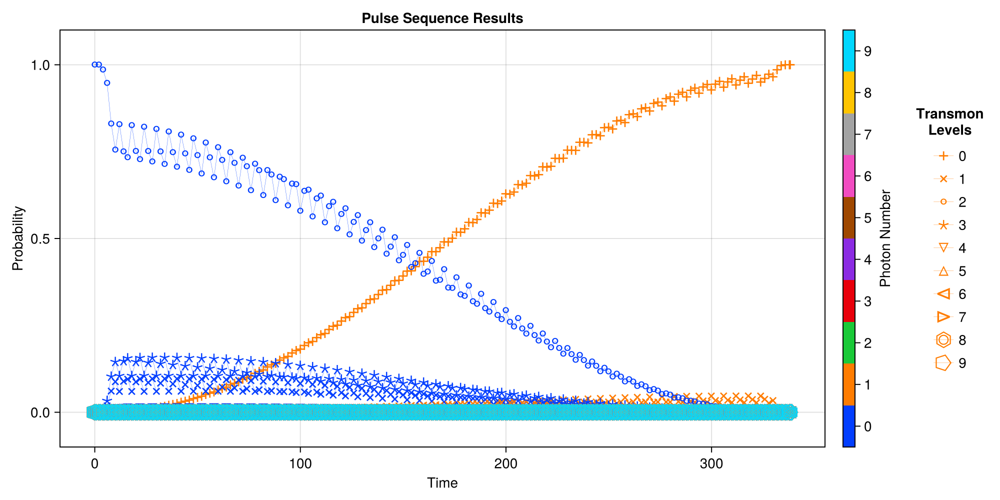

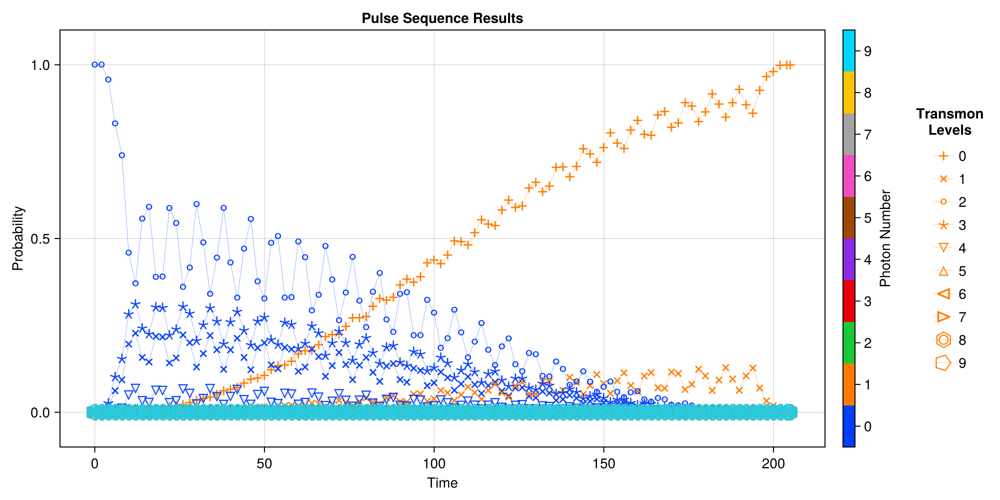

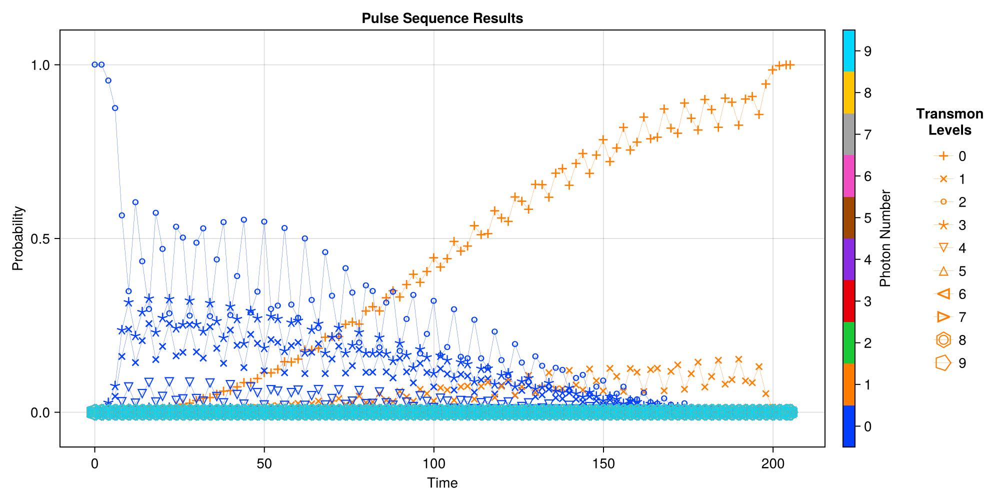

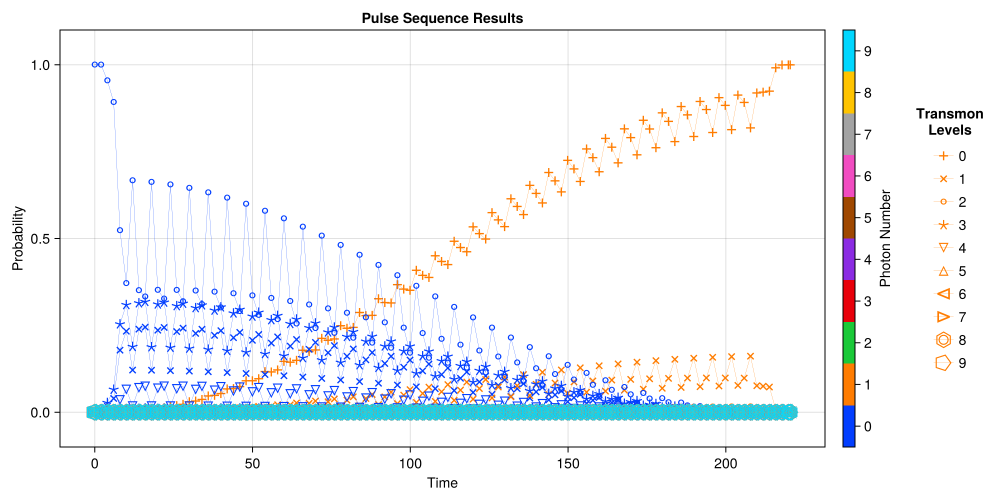

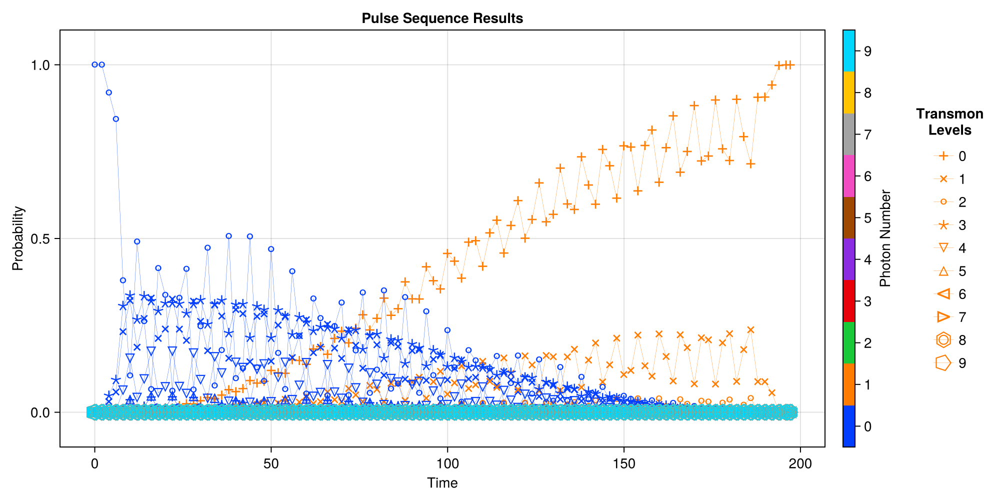

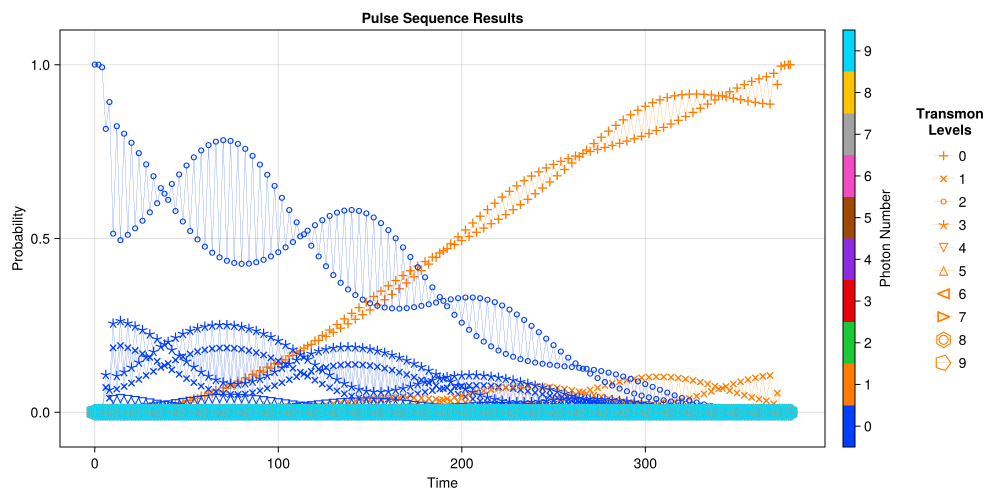

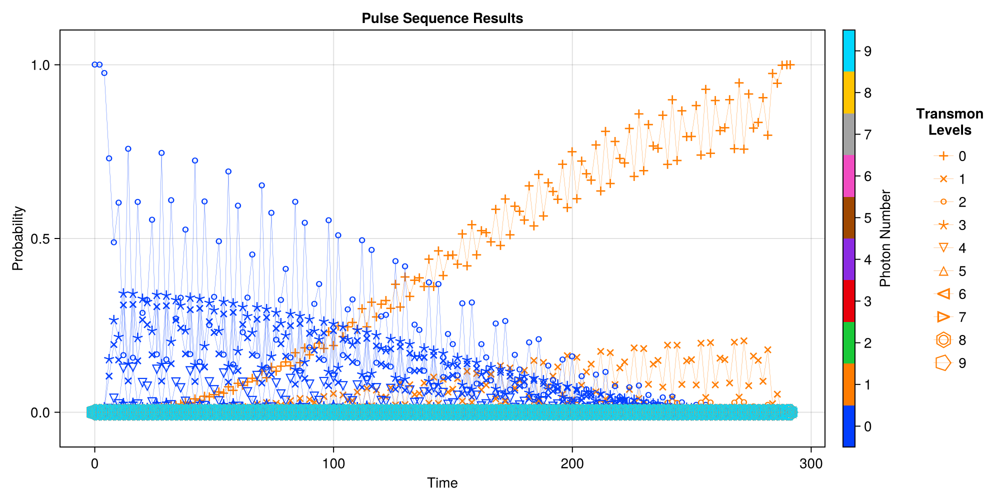

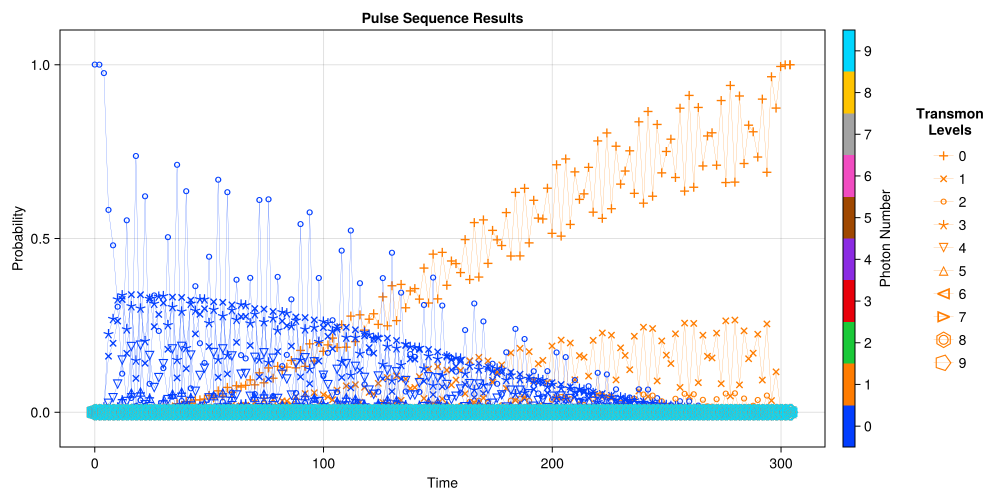

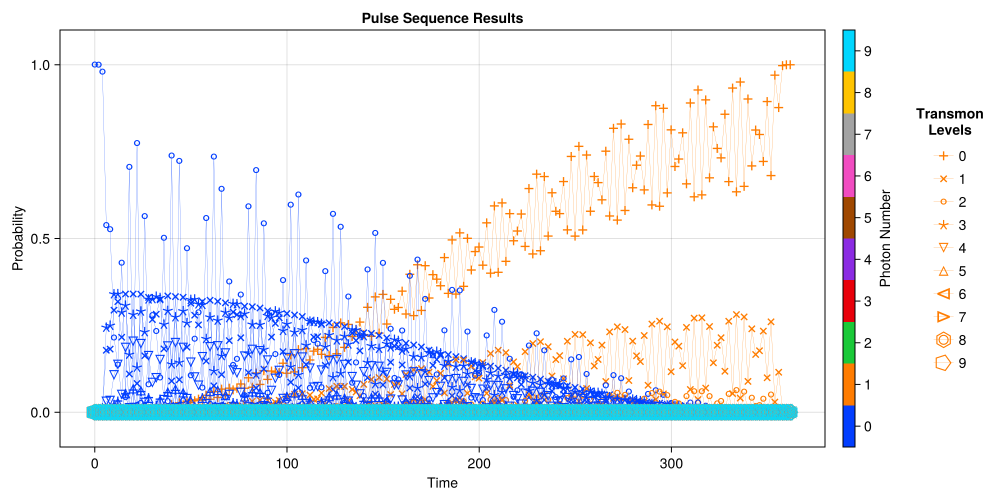

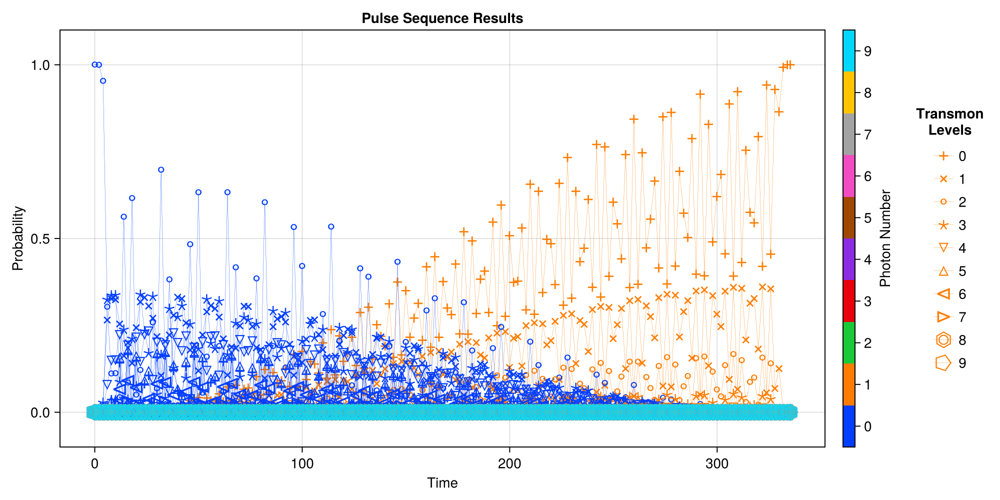

In [13]:
for i in 1:10
    SC.Dynamics.PlotSingleModeEvolution(Models[i], f0g1_res[i]["times"], f0g1_res[i]["states"], plot_every = 10)
end

# Loading Run Data

In [5]:
Run_Data = []
for i in 1:10
    push!(Run_Data, SC.Utils.LoadRunResults("data/f0g1_fidelities_mode_$i.nc"))
end

NetCDF.NetCDFError: NetCDF error code 2:
	No such file or directory

# Analysis

In [6]:
Run_Data[1]

Dict{Any, Any} with 2 entries:
  "times"  => Any[0.0, 0.499645, 0.999289, 1.49893, 1.99858, 2.49822, 2.99787, …
  "states" => Any[Quantum Object:   type=Operator   dims=[10, 10]   size=(100, …

In [14]:
f0g1_res[1]["states"];

In [16]:
EVs = []
EVs_Loss = []

@progress for i in 1:10
    proj_dict = SC.Utils.Get_Projection_Ops(Models[1].dressed_states);
    push!(EVs, SC.Utils.Get_EVs(f0g1_res[i]["states"], proj_dict));
    push!(EVs_Loss, SC.Utils.Get_EVs(Run_Data[i]["states"], proj_dict));
end

In [128]:
final_probs = [1.0 for i in 1:10]

for i in 1:10
    for key in keys(EVs[i])
        κ_tc = Models[i].params["kappa_tc"]*key[1]
        κ_td = Models[i].params["kappa_td"]*2*key[1]
        κ_cc = Models[i].params["kappa_cc"][1]*key[2]

        δt = f0g1_res[i]["times"][5]-f0g1_res[i]["times"][4]
        riemann_sum = real(sum(EVs[i][key]))*δt*length(f0g1_res[i]["times"])
        average_pop = riemann_sum/f0g1_res[i]["times"][end]
        final_probs[i] += -(average_pop*(κ_tc + κ_td + κ_cc))
    end
end

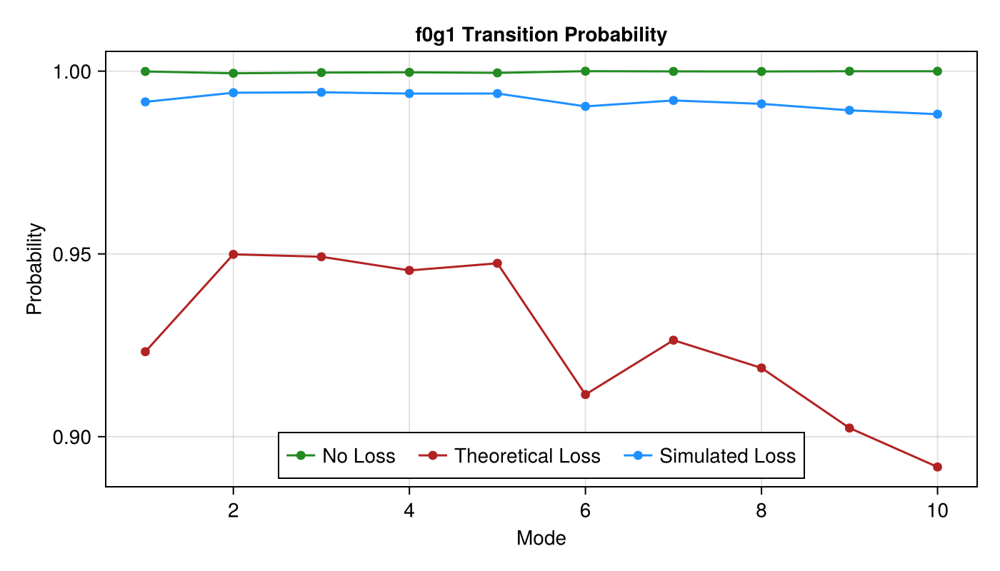

In [129]:
f = cm.Figure(size = (700, 400))
ax = cm.Axis(f[1, 1], xlabel = "Mode", ylabel = "Probability", title = "f0g1 Transition Probability")

y = [Models[i].Stuff["op_drive_params"]["sb_f0g1"]["accuracy"] for i in 1:10]

cm.scatterlines!(ax, y, color = "forestgreen", label = "No Loss")
cm.scatterlines!(ax, final_probs, color = "firebrick", label = "Theoretical Loss")

y = [EVs_Loss[i][(0,1)][end] for i in 1:10]
cm.scatterlines!(ax, real.(y), color = "dodgerblue", label = "Simulated Loss")

cm.axislegend(ax, position = :cb, orientation = :horizontal)

display(f);

In [52]:
Models[1].Stuff["op_drive_params"]["sb_f0g1"]

Dict{String, Any} with 7 entries:
  "pulse_time"    => 338.259
  "Envelope Args" => Dict{String, Any}("pulse_time"=>338.259, "k"=>2, "ramp_tim…
  "epsilon"       => 0.295
  "Envelope"      => "Bump_Ramp"
  "shift"         => 0.0152459
  "accuracy"      => 0.999909
  "freq_d"        => -3.34906